In [1]:
import xarray as xr
import numpy as np
import cmocean as cm
import copernicusmarine
import matplotlib.pyplot as plt
import cartopy
import matplotlib.colors as mcolors
import cartopy.crs as ccrs

/work/bk1450/b383184/conda/envs/parcels_3.1.2/lib/python3.13/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [8]:
def monthly_mean(data):
    
    mmean = data.groupby('time.month').mean(dim='time')
    return mmean

# helper to build alpha from hist slice
def make_alpha(H2):
    with np.errstate(divide='ignore', invalid='ignore'):
        L = np.log10(H2)
    L = L.where(np.isfinite(L), other=np.nan)
    vmax = float(L.max().values) if np.isfinite(L.max()).item() else 0.0
    vmin = float(L.min().values) if np.isfinite(L.min()).item() else 0.0
    if vmax > vmin:
        A = (L - vmin) / (vmax - vmin)
    else:
        A = xr.zeros_like(L)
    return A.fillna(0.0) ** 0.7  # gamma


In [3]:
hist = xr.open_dataset("_hist_5day_.nc").compute().histogram_lon_lat
hist

<xarray.DataArray 'histogram_lon_lat' (obs: 37, lon: 29, lat: 29,
                                       start_year: 4, start_month: 12,
                                       start_day: 6)> Size: 72MB
array([[[[[[ 0.,  0.,  0.,  0.,  0.,  0.],
           [ 0.,  0.,  0.,  0.,  0.,  0.],
           [ 0.,  0.,  0.,  0.,  0.,  0.],
           ...,
           [ 0.,  0.,  0.,  0.,  0.,  0.],
           [ 0.,  0.,  0.,  0.,  0.,  0.],
           [ 0.,  0.,  0.,  0.,  0.,  0.]],

          [[ 0.,  0.,  0.,  0.,  0.,  0.],
           [ 0.,  0.,  0.,  0.,  0.,  0.],
           [ 0.,  0.,  0.,  0.,  0.,  0.],
           ...,
           [ 0.,  0.,  0.,  0.,  0.,  0.],
           [ 0.,  0.,  0.,  0.,  0.,  0.],
           [ 0.,  0.,  0.,  0.,  0.,  0.]],

          [[ 0.,  0.,  0.,  0.,  0.,  0.],
           [ 0.,  0.,  0.,  0.,  0.,  0.],
           [ 0.,  0.,  0.,  0.,  0.,  0.],
           ...,
...
           [ 0.,  0.,  0.,  0.,  0.,  0.],
           [ 0.,  0.,  0.,  0.,  0.,  0.],
           [ 0.,  0.,  0.,  0.,  0.,  0.]],

          [[ 0.,  0.,  0.,  0.,  0.,  0.],
           [ 0.,  0.,  0.,  0.,  0.,  0.],
           [ 0.,  0.,  0.,  0.,  0.,  0.],
           ...,
           [ 0.,  0.,  0.,  0.,  0.,  0.],
           [ 0.,  0.,  0.,  0.,  0.,  0.],
           [ 0.,  0.,  0.,  0.,  0.,  0.]],

          [[ 0.,  0.,  0.,  0.,  0.,  0.],
           [ 0.,  0.,  0.,  0.,  0.,  0.],
           [ 0.,  0.,  0.,  0.,  0.,  0.],
           ...,
           [ 0.,  0.,  0.,  0.,  0.,  0.],
           [ 0.,  0.,  0.,  0.,  0.,  0.],
           [ 0.,  0.,  0.,  0.,  0.,  0.]]]]]],
      shape=(37, 29, 29, 4, 12, 6))
Coordinates:
  * start_year   (start_year) int64 32B 2022 2023 2024 2025
  * start_month  (start_month) int64 96B 1 2 3 4 5 6 7 8 9 10 11 12
  * start_day    (start_day) float64 48B 5.0 10.0 15.0 20.0 25.0 30.0
  * obs          (obs) float64 296B 10.5 30.5 50.5 70.5 ... 690.5 710.5 730.5
  * lon          (lon) float32 116B -88.2 -85.11 -82.01 ... -7.737 -4.642 -1.548
  * lat          (lat) float32 116B -5.438 -4.227 -3.016 ... 26.05 27.26 28.47

In [4]:
ssh5 = xr.open_dataset('ssh_5d_avg.nc')
ssh5 = ssh5.drop_sel(time='2022-06-01')
ssh5

<xarray.Dataset> Size: 360MB
Dimensions:    (latitude: 372, longitude: 1026, time: 236)
Coordinates:
    depth      float32 4B ...
  * latitude   (latitude) float32 1kB -4.333 -4.25 -4.167 ... 26.42 26.5 26.58
  * longitude  (longitude) float32 4kB -87.0 -86.92 -86.83 ... -1.667 -1.583
  * time       (time) datetime64[ns] 2kB 2022-06-06 2022-06-11 ... 2025-08-24
Data variables:
    zos        (time, latitude, longitude) float32 360MB ...

In [5]:
ssh5 = ssh5.assign_coords(start_year=ssh5.time.dt.year)
ssh5 = ssh5.assign_coords(start_month=ssh5.time.dt.month)
ssh5 = ssh5.assign_coords(start_day=ssh5.time.dt.day)
# ssh5['start_day'] = (np.round((ssh5.start_day / 5))*5)
ssh5

<xarray.Dataset> Size: 360MB
Dimensions:      (latitude: 372, longitude: 1026, time: 236)
Coordinates:
    depth        float32 4B ...
  * latitude     (latitude) float32 1kB -4.333 -4.25 -4.167 ... 26.42 26.5 26.58
  * longitude    (longitude) float32 4kB -87.0 -86.92 -86.83 ... -1.667 -1.583
  * time         (time) datetime64[ns] 2kB 2022-06-06 2022-06-11 ... 2025-08-24
    start_year   (time) int64 2kB 2022 2022 2022 2022 ... 2025 2025 2025 2025
    start_month  (time) int64 2kB 6 6 6 6 6 7 7 7 7 7 7 ... 7 7 7 7 7 8 8 8 8 8
    start_day    (time) int64 2kB 6 11 16 21 26 1 6 11 ... 20 25 30 4 9 14 19 24
Data variables:
    zos          (time, latitude, longitude) float32 360MB ...

In [6]:
d5 = np.tile([5, 10, 15, 20, 25, 30], (len(ssh5.time.dt.day) + 5) // 6)[:len(ssh5.time.dt.day)]
# ssh5 = ssh5.drop_coords('start_day')  # Or .drop_coords if it's a coord
ssh5 = ssh5.assign_coords(start_day=('time', d5))
ssh5_day = ssh5.groupby(['start_year','start_month','start_day']).mean()
ssh5_day

<xarray.Dataset> Size: 440MB
Dimensions:      (start_year: 4, start_month: 12, start_day: 6, latitude: 372,
                  longitude: 1026)
Coordinates:
  * start_year   (start_year) int64 32B 2022 2023 2024 2025
  * start_month  (start_month) int64 96B 1 2 3 4 5 6 7 8 9 10 11 12
  * start_day    (start_day) int64 48B 5 10 15 20 25 30
    depth        float32 4B 0.494
  * latitude     (latitude) float32 1kB -4.333 -4.25 -4.167 ... 26.42 26.5 26.58
  * longitude    (longitude) float32 4kB -87.0 -86.92 -86.83 ... -1.667 -1.583
Data variables:
    zos          (latitude, longitude, start_year, start_month, start_day) float32 440MB ...

/work/bk1450/b383184/conda/envs/parcels_3.1.2/lib/python3.13/site-packages/xarray/computation/apply_ufunc.py:814: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


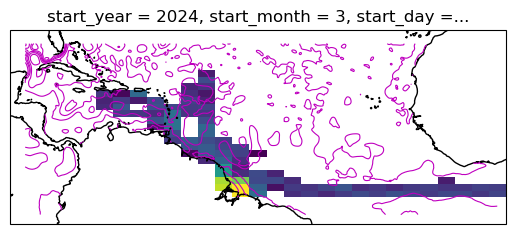

In [7]:
# ssh5_day.zos.sel(start_year=2025, start_month=8, start_day=30).plot.contour(levels=20,robust=True,cmap='jet')
syr = 2024
smon =3 
sday =25 

ax = plt.axes(projection=cartopy.crs.PlateCarree())


data = hist.sel(start_year=syr, start_month=smon, start_day=sday).sum("obs")

np.log10(data).plot(
                x="lon", y="lat",
                transform=cartopy.crs.PlateCarree(), ax=ax,
                add_colorbar=False
            )

cs = ssh5_day.zos.sel(start_year=syr, start_month=smon, start_day=sday).plot.contour(robust=True,
    ax=ax, transform=cartopy.crs.PlateCarree(),
    cmap='m', linewidths=0.8
)
# ax.clabel(cs, fmt="%.2f", fontsize=7)  # add labels
ax.coastlines()


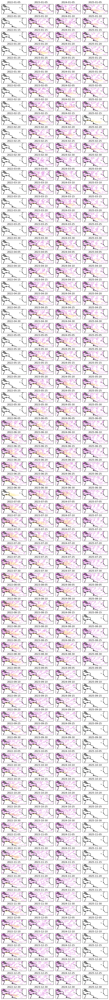

In [11]:
# config
use_varying_alpha = True   # True = your liked yellows (log-scaled alpha); False = flat yellow
shadow_alpha_flat = 0.55   # used only when use_varying_alpha=False
threshold = 0              # show cells with counts > threshold

# palettes
yellow = (1.0, 0.85, 0.15, 1.0)
cmap_yellow = mcolors.ListedColormap(['cyan'])

# unique values
unique_years  = sorted(np.unique(hist.start_year.data))
unique_months = sorted(np.unique(hist.start_month.data))
unique_days   = sorted(np.unique(hist.start_day.data))

num_years  = len(unique_years)
num_months = len(unique_months)
num_days   = len(unique_days)

fig, ax = plt.subplots(
    num_months * num_days, num_years,
    figsize=(num_years * 2, num_months * num_days),
    subplot_kw={"projection": ccrs.PlateCarree()},
)

np.seterr(divide='ignore')

for nyr, syr in enumerate(unique_years):
    for nmon, smon in enumerate(unique_months):
        for nday, sday in enumerate(unique_days):
            row = nmon * num_days + nday
            _ax = ax[row, nyr]

            # SSH contours
            ssh5_day.zos.sel(start_year=syr, start_month=smon, start_day=sday).plot.contour(
                ax=_ax, transform=ccrs.PlateCarree(),
                robust=True, cmap='m', linewidths=0.4, add_colorbar=False
            )

            # Histogram slice collapsed over obs
            H2 = hist.sel(start_year=syr, start_month=smon, start_day=sday).sum("obs")  # lon x lat

            if use_varying_alpha:
                # yellow with varying alpha from log10 intensity
                A = make_alpha(H2)                            # lon x lat in [0,1]
                A_np = A.transpose("lon", "lat").values
                xmin = float(H2.lon.min()); xmax = float(H2.lon.max())
                ymin = float(H2.lat.min()); ymax = float(H2.lat.max())
                rgba = np.zeros((A_np.shape[0], A_np.shape[1], 4), dtype=float)
                rgba[..., 0] = 1.00
                rgba[..., 1] = 0.85
                rgba[..., 2] = 0.15
                rgba[..., 3] = 0.55 * A_np
                _ax.imshow(
                    rgba,
                    extent=[xmin, xmax, ymin, ymax],
                    origin="lower",
                    interpolation="nearest",    # 'bilinear' for softer look
                    transform=ccrs.PlateCarree(),
                    zorder=1,
                )
            else:
                # flat yellow everywhere H2 > threshold
                mask = (H2 > threshold).transpose("lon", "lat")
                Z = xr.where(mask, 1, np.nan)
                Z.plot.pcolormesh(
                    x="lon", y="lat",
                    cmap=cmap_yellow, vmin=0, vmax=1,
                    add_colorbar=False,
                    alpha=shadow_alpha_flat,
                    ax=_ax, transform=ccrs.PlateCarree()
                )

            _ax.set_title(f"{int(syr):04d}-{int(smon):02d}-{int(sday):02d}")
            _ax.coastlines()

fig.tight_layout()

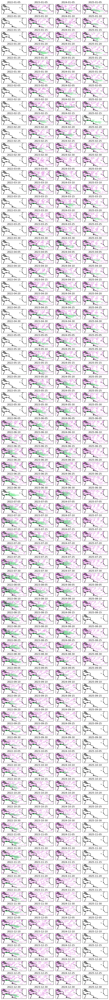

In [12]:
# config
use_varying_alpha = True    # True: log-scaled alpha; False: flat fill
shadow_alpha_flat = 0.75    # used only when use_varying_alpha=False
alpha_scale_vary  = 0.90    # scales the per-cell alpha (0..1) in varying-alpha mode
threshold = 0               # show cells with counts > threshold

# color: strong green
green = (0.05, 0.85, 0.25, 1.0)     # tweak as needed
cmap_green = mcolors.ListedColormap([green])

unique_years  = sorted(np.unique(hist.start_year.data))
unique_months = sorted(np.unique(hist.start_month.data))
unique_days   = sorted(np.unique(hist.start_day.data))

num_years  = len(unique_years)
num_months = len(unique_months)
num_days   = len(unique_days)

fig, ax = plt.subplots(
    num_months * num_days, num_years,
    figsize=(num_years * 2, num_months * num_days),
    subplot_kw={"projection": ccrs.PlateCarree()},
)

np.seterr(divide='ignore')

for nyr, syr in enumerate(unique_years):
    for nmon, smon in enumerate(unique_months):
        for nday, sday in enumerate(unique_days):
            row = nmon * num_days + nday
            _ax = ax[row, nyr]

            # SSH contours
            ssh5_day.zos.sel(start_year=syr, start_month=smon, start_day=sday).plot.contour(
                ax=_ax, transform=ccrs.PlateCarree(),
                robust=True, cmap='m', linewidths=0.4, add_colorbar=False
            )

            # Histogram slice collapsed over obs
            H2 = hist.sel(start_year=syr, start_month=smon, start_day=sday).sum("obs")  # lon x lat

            if use_varying_alpha:
                # green with varying alpha from log10 intensity
                A = make_alpha(H2)                            # lon x lat in [0,1]
                A_np = A.transpose("lon", "lat").values
                xmin = float(H2.lon.min()); xmax = float(H2.lon.max())
                ymin = float(H2.lat.min()); ymax = float(H2.lat.max())
                rgba = np.zeros((A_np.shape[0], A_np.shape[1], 4), dtype=float)
                rgba[..., 0] = green[0]
                rgba[..., 1] = green[1]
                rgba[..., 2] = green[2]
                rgba[..., 3] = alpha_scale_vary * A_np
                _ax.imshow(
                    rgba,
                    extent=[xmin, xmax, ymin, ymax],
                    origin="lower",
                    interpolation="nearest",   # 'bilinear' for softer look
                    transform=ccrs.PlateCarree(),
                    zorder=1,
                )
            else:
                # flat green everywhere H2 > threshold
                mask = (H2 > threshold).transpose("lon", "lat")
                Z = xr.where(mask, 1, np.nan)
                Z.plot.pcolormesh(
                    x="lon", y="lat",
                    cmap=cmap_green, vmin=0, vmax=1,
                    add_colorbar=False,
                    alpha=shadow_alpha_flat,
                    ax=_ax, transform=ccrs.PlateCarree()
                )

            _ax.set_title(f"{int(syr):04d}-{int(smon):02d}-{int(sday):02d}")
            _ax.coastlines()

fig.tight_layout()

In [ ]:
# Get unique sorted values
unique_years = sorted(np.unique(hist.start_year.data))
unique_months = sorted(np.unique(hist.start_month.data))
unique_days = sorted(np.unique(hist.start_day.data))  # e.g., [1,6,11,16,21] or whatever your 5 days are

num_years = len(unique_years)
num_months = len(unique_months)
num_days = len(unique_days)  # Should be 5

# Create subplots: rows = months * days (grouped by month), columns = years
fig, ax = plt.subplots(
    num_months * num_days, num_years,
    figsize=(num_years * 2, num_months * num_days),  # Adjust size dynamically
    subplot_kw={"projection": cartopy.crs.PlateCarree()},
)

np.seterr(divide='ignore')  # Don't warn on np.log10 on invalid or 0 data

for nyr, syr in enumerate(unique_years):
    for nmon, smon in enumerate(unique_months):
        for nday, sday in enumerate(unique_days):
            # Calculate row index: group days within each month
            row = nmon * num_days + nday
            _ax = ax[row, nyr]

            cs = ssh5_day.zos.sel(start_year=syr, start_month=smon, start_day=sday).plot.contour(
                ax=_ax, transform=cartopy.crs.PlateCarree(),robust=True, cmap='m', linewidths=0.4)
            
            # Select and plot (assuming 'obs' is the dimension to sum over)
            data = hist.sel(start_year=syr, start_month=smon, start_day=sday).sum("obs")
            np.log10(data).plot(
                x="lon", y="lat",
                transform=cartopy.crs.PlateCarree(), ax=_ax,
                add_colorbar=False
            )

            # _ax.clabel(cs, fmt="%.2f", fontsize=2)
                                                                                            
            _ax.set_title(f"{int(syr):04d}-{int(smon):02d}-{int(sday):02d}")
            _ax.coastlines()

fig.tight_layout()
# fig.savefig('particles_5days_ssh.pdf', dpi=300, bbox_inches='tight')

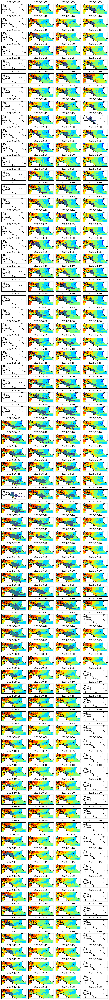

In [13]:
# Get unique sorted values
unique_years = sorted(np.unique(hist.start_year.data))
unique_months = sorted(np.unique(hist.start_month.data))
unique_days = sorted(np.unique(hist.start_day.data))  # e.g., [1,6,11,16,21] or whatever your 5 days are

num_years = len(unique_years)
num_months = len(unique_months)
num_days = len(unique_days)  # Should be 5

# Create subplots: rows = months * days (grouped by month), columns = years
fig, ax = plt.subplots(
    num_months * num_days, num_years,
    figsize=(num_years * 2, num_months * num_days),  # Adjust size dynamically
    subplot_kw={"projection": cartopy.crs.PlateCarree()},
)

np.seterr(divide='ignore')  # Don't warn on np.log10 on invalid or 0 data

for nyr, syr in enumerate(unique_years):
    for nmon, smon in enumerate(unique_months):
        for nday, sday in enumerate(unique_days):
            # Calculate row index: group days within each month
            row = nmon * num_days + nday
            _ax = ax[row, nyr]
            
            cs = ssh5_day.zos.sel(start_year=syr, start_month=smon, start_day=sday).plot.contourf(
                ax=_ax, transform=cartopy.crs.PlateCarree(),robust=True, cmap='jet',add_colorbar=False)
            
            # Select and plot (assuming 'obs' is the dimension to sum over)
            data = hist.sel(start_year=syr, start_month=smon, start_day=sday).sum("obs")
            np.log10(data).plot(
                x="lon", y="lat",
                transform=cartopy.crs.PlateCarree(), ax=_ax,
                add_colorbar=False
            )

            # _ax.clabel(cs, fmt="%.2f", fontsize=2)
                                                                                            
            _ax.set_title(f"{int(syr):04d}-{int(smon):02d}-{int(sday):02d}")
            _ax.coastlines()

fig.tight_layout()

In [ ]:
# import dask
# with dask.config.set(scheduler='single-threaded'):
#     ssh_5day_avg = ssh_5day_avg.load()